In [2]:
# changing cwd
%cd ..

c:\Users\jongm\Desktop\temp_workspace\Python\JOVO\induced_bias_exp


## Load packages

In [1]:
import seaborn as sns
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle

from scipy.ndimage import gaussian_filter

cmap = 'PRGn'

from itertools import product

In [3]:
from src.inductive_bias import IB
ib = IB() #instantiate inductive bias package

[ c:\Users\jongm\Desktop\temp_workspace\Python\JOVO\induced_bias_exp\clf\SimulationData.pickle ] loaded
[ c:\Users\jongm\Desktop\temp_workspace\Python\JOVO\induced_bias_exp\clf\PosteriorData.pickle ] loaded
[ c:\Users\jongm\Desktop\temp_workspace\Python\JOVO\induced_bias_exp\clf\TrainedCLF.pickle ] loaded
[ c:\Users\jongm\Desktop\temp_workspace\Python\JOVO\induced_bias_exp\clf\EstimatedData.pickle ] loaded
[ c:\Users\jongm\Desktop\temp_workspace\Python\JOVO\induced_bias_exp\clf\HellingerData.pickle ] loaded
Size of the S-XOR: (6322,)                    
Size of the Spiral: (6276,)                    
Size of the whole dataset: (12598, 7)

Size of the S-XOR after adding hellinger: (6322, 8)            
Size of the Spiral after adding hellinger: (6276, 8)


## Time and Date of the experiment

In [4]:
print(ib.date)

2021-04-18 02:53:12.862697


In [5]:
uX = ib.mask
uX0, uX1 = uX[:,0], uX[:,1]
uXh = np.column_stack([ib.human[0][:,3], ib.human[0][:,5]])
uXh0, uXh1 = ib.human[0][:,3], ib.human[0][:,5]
label = ib.mtype[:3] + ['Human'] #excluding QDA
fsize= 18

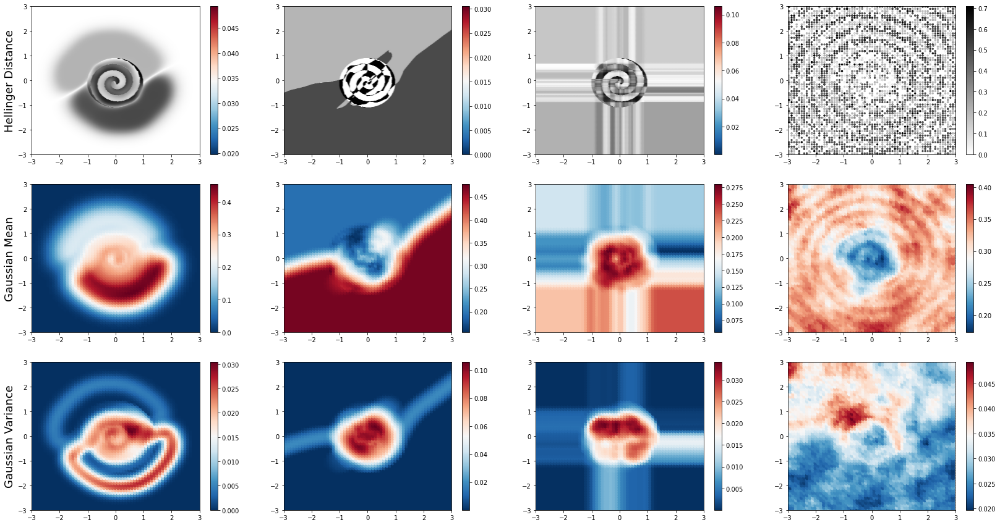

In [115]:
# plots figure
# simulation dataset, hellinger distance, gaussian variance of 3 ML models + human
fig, axs = plt.subplots(3,4,figsize=(7*4,5*3))

for i in tqdm(range(4)):
    if i == 3:
        mlp = axs[0,i].scatter(x=uXh0, y=uXh1, c=ib.human[0][:,6], cmap='binary', s=5)
        temp = np.column_stack([uXh, ib.human[0][:,6]]).astype(float)
    else:
        mlp = axs[0,i].scatter(x=uX0, y=uX1, c=ib.hdist[1][2][i], cmap='binary')
        temp = np.column_stack([uX, ib.hdist[1][2][i]])

    plt.colorbar(mlp, ax=axs[0,i])

    xy, post = ib.smooth_gaussian_distance(temp, method='mean', step=0.1, radius=0.5)
    mlp = axs[1,i].scatter(x=np.array(xy)[:,0],y=np.array(xy)[:,1],c=post, cmap='RdBu_r')
    plt.colorbar(mlp, ax=axs[1,i])

    xy, post = ib.smooth_gaussian_distance(temp, method='var', step=0.1, radius=0.5)
    mlp = axs[2,i].scatter(x=np.array(xy)[:,0],y=np.array(xy)[:,1],c=post, cmap='RdBu_r')
    plt.colorbar(mlp, ax=axs[2,i])

    for j in range(3):
        axs[j,i].set_xlim([-3,3])
        axs[j,i].set_ylim([-3,3])

    if i == 0:
        axs[0,i].set_ylabel('Hellinger Distance', fontsize=fsize)
        axs[1,i].set_ylabel('Gaussian Mean', fontsize=fsize)
        axs[2,i].set_ylabel('Gaussian Variance', fontsize=fsize)

plt.savefig(f'figs/[20210407_gaussian_variance]_variance_plot_spiral_{str(ib.date.date())}.png', bbox_inches='tight')

In [215]:
uXh = np.column_stack([ib.human[1][:,3], ib.human[1][:,5]]).astype(float)
uXh0, uXh1 = uXh[:,0], uXh[:,1]

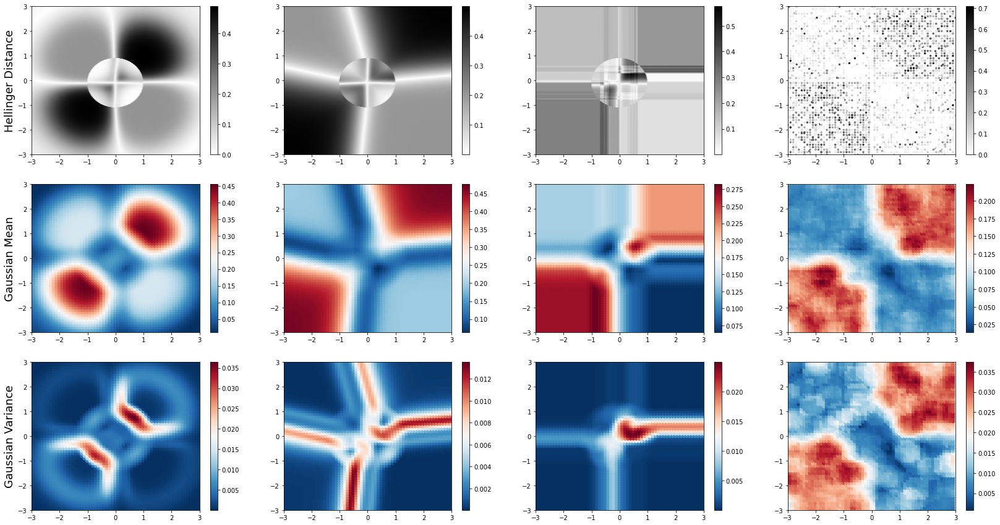

In [216]:
# plots figure
# simulation dataset, hellinger distance, gaussian variance of 3 ML models + human
fig, axs = plt.subplots(3,4,figsize=(7*4,5*3))

uXh0, uXh1 = ib.human[1][:,3], ib.human[1][:,5]

for i in tqdm(range(4)):
    if i == 3:
        mlp = axs[0,i].scatter(x=uXh0, y=uXh1, c=ib.human[1][:,6], cmap='binary', s=5)
        temp = np.column_stack([uXh, ib.human[1][:,6]]).astype(float)
    else:
        mlp = axs[0,i].scatter(x=uX0, y=uX1, c=ib.hdist[1][4][i], cmap='binary')
        temp = np.column_stack([uX, ib.hdist[1][4][i]])

    plt.colorbar(mlp, ax=axs[0,i])

    xy, post = ib.smooth_gaussian_distance(temp, method='mean', step=0.1, radius=0.5)
    mlp = axs[1,i].scatter(x=np.array(xy)[:,0],y=np.array(xy)[:,1],c=post, cmap='RdBu_r')
    plt.colorbar(mlp, ax=axs[1,i])

    xy, post = ib.smooth_gaussian_distance(temp, method='var', step=0.1, radius=0.5)
    mlp = axs[2,i].scatter(x=np.array(xy)[:,0],y=np.array(xy)[:,1],c=post, cmap='RdBu_r')
    plt.colorbar(mlp, ax=axs[2,i])

    for j in range(3):
        axs[j,i].set_xlim([-3,3])
        axs[j,i].set_ylim([-3,3])

    if i == 0:
        axs[0,i].set_ylabel('Hellinger Distance', fontsize=fsize)
        axs[1,i].set_ylabel('Gaussian Mean', fontsize=fsize)
        axs[2,i].set_ylabel('Gaussian Variance', fontsize=fsize)

plt.savefig(f'figs/[20210407_gaussian_variance]_variance_plot_sxor_{str(ib.date.date())}.png', bbox_inches='tight')

In [7]:
def plot_meanvar(truepst, human, fname, complete):
    
    rad_range = np.arange(0,1.1,0.2)
    s = len(rad_range)
    methods = ['mean', 'var']
    t = len(methods)

    fig, axs = plt.subplots(t, s, figsize=(7*s,5*t))

    for j, meth in enumerate(methods):
        for i, rad in enumerate(rad_range):
            if i == 0:
                if j == 1:
                    mlp = axs[j,i].scatter(x=uX0,y=uX1,c=truepst, cmap=cmap)
                    axs[j,i].set_title('True Posterior', fontsize=fsize)
                else:
                    mlp = axs[j,i].scatter(x=uXh0,y=uXh1,c=human, cmap=cmap,s=5)
                    axs[j,i].set_title('Human Estimate', fontsize=fsize)

            else:
                temp = np.column_stack([uXh, human]).astype(float)
                if complete:                    
                    xy, temp2 = ib.smooth_gaussian_distance(temp, method=meth, step=0.1, radius=rad, complete=complete)               
                else:
                    xy, temp2 = ib.smooth_gaussian_distance(temp, method=meth, step=0.1, radius=rad)  

                mlp = axs[j,i].scatter(x=np.array(xy)[:, 0], y=np.array(xy)[:, 1], c=temp2, cmap='RdBu_r')

                if j == 0:
                    axs[j,i].set_title(f'r = {rad.round(1)}', fontsize=fsize)

            plt.colorbar(mlp, ax=axs[j,i])

            if i == 1:
                if j == 0:
                    axs[j,i].set_ylabel('Mean', fontsize=fsize)        
                else:
                    axs[j,i].set_ylabel('Variance', fontsize=fsize)        

            axs[j,i].set_xlim([-3,3])
            axs[j,i].set_ylim([-3,3])

    plt.savefig(f'figs/[20210407_gaussian_variance]_mean-var_radius_{fname}_{str(ib.date.date())}.png', bbox_inches='tight')

    plt.show()

In [6]:
uXh = np.column_stack([ib.human[0][:,3], ib.human[0][:,5]])
uXh0, uXh1 = uXh[:,0], uXh[:,1]

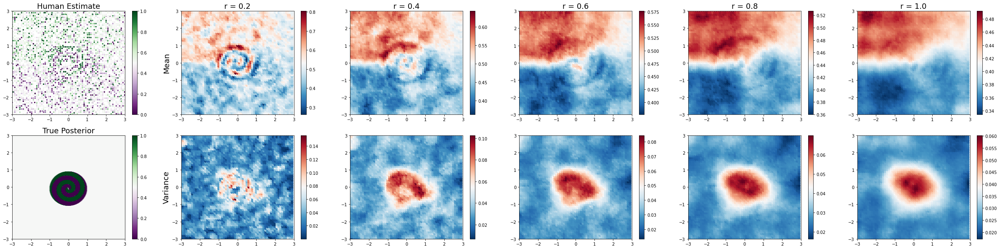

In [8]:
truepst = ib.truepst[1][2][2]
human = ib.human[0][:,0]

plot_meanvar(truepst, human, 'spiral_posterior', complete=True)

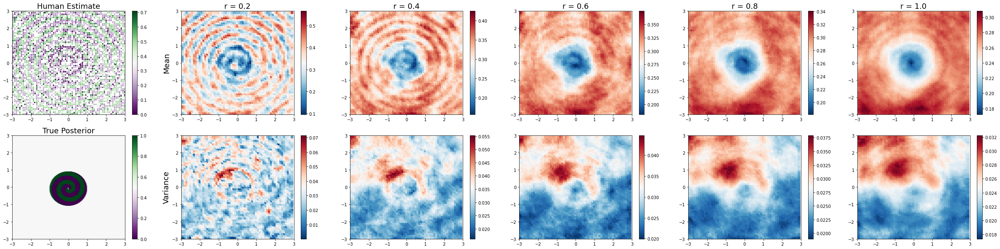

In [211]:
truepst = ib.truepst[1][2][2]
human = ib.human[0][:,6]

plot_meanvar(truepst, human, 'spiral_hellinger', complete=True)

In [212]:
uXh = np.column_stack([ib.human[1][:,3], ib.human[1][:,5]]).astype(float)
uXh0, uXh1 = uXh[:,0], uXh[:,1]

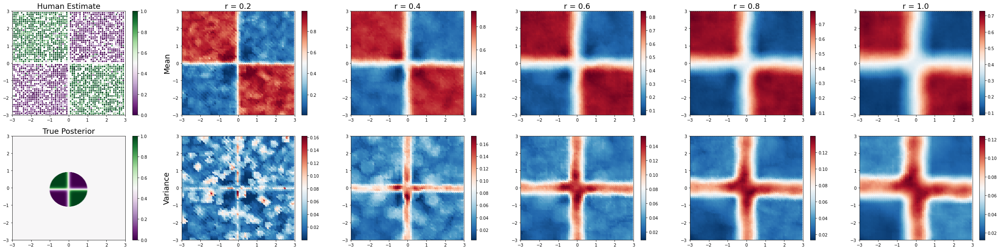

In [213]:
truepst = ib.truepst[1][4][2]
human = ib.human[1][:,0]

plot_meanvar(truepst, human, 'sxor_posterior')

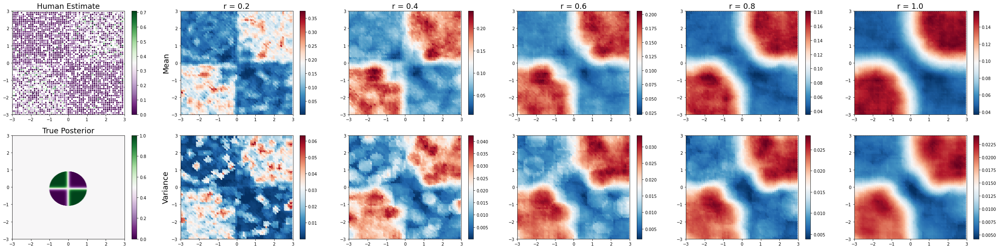

In [214]:
truepst = ib.truepst[1][4][2]
human = ib.human[1][:,6]

plot_meanvar(truepst, human, 'sxor_hellinger')

In [ ]:
truepst = ib.truepst[1][2][2]
human = ib.human[0][:,0]

plot_meanvar(truepst, human, 'spiral_posterior', complete=True)

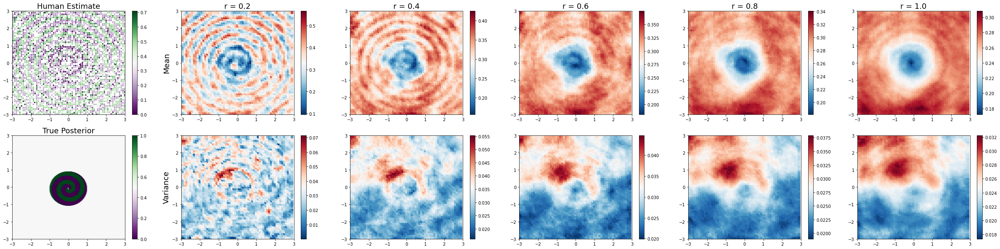

In [9]:
truepst = ib.truepst[1][2][2]
human = ib.human[0][:,6]

plot_meanvar(truepst, human, 'spiral_hellinger', complete=True)

In [10]:
uXh = np.column_stack([ib.human[1][:,3], ib.human[1][:,5]]).astype(float)
uXh0, uXh1 = uXh[:,0], uXh[:,1]

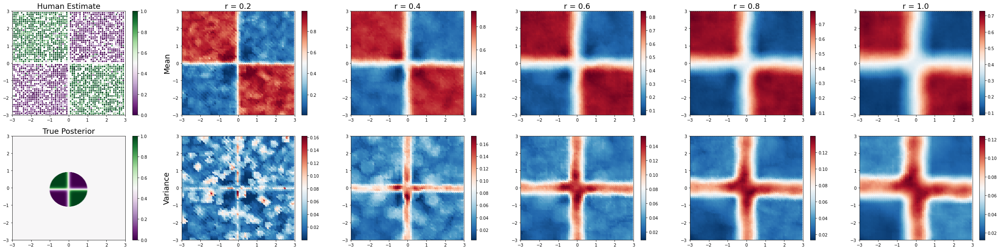

In [11]:
truepst = ib.truepst[1][4][2]
human = ib.human[1][:,0]

plot_meanvar(truepst, human, 'sxor_posterior', complete=True)

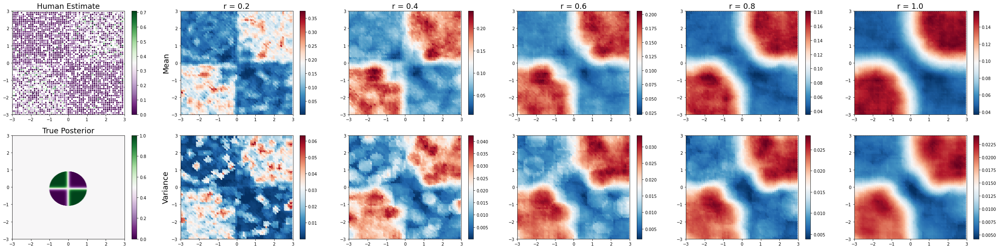

In [12]:
truepst = ib.truepst[1][4][2]
human = ib.human[1][:,6]

plot_meanvar(truepst, human, 'sxor_hellinger', complete=True)

## Demonstration of gaussian smoothing implementation

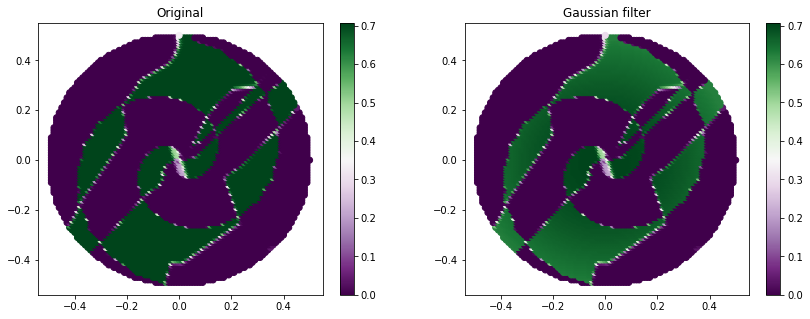

In [165]:
fig, axs= plt.subplots(1,2,figsize=(7*2,5))

xy = [0,0]

ttemp = np.column_stack([ib.mask, ib.hdist[1][2][1]])

boundary = ttemp[ib._euclidean(ttemp, xy) < 0.5]

xx = boundary[:,0]
yy = boundary[:,1]
cc = boundary[:,2]

mlp = axs[0].scatter(x=xx, y=yy, c=cc, cmap='PRGn')
plt.colorbar(mlp, ax=axs[0])
axs[0].set_title('Original')


mlp = axs[1].scatter(x=xx, y=yy, c=ib._gauss2d(xx, yy, xy[0], xy[1], cc), cmap='PRGn')
plt.colorbar(mlp, ax=axs[1])
axs[1].set_title('Gaussian filter')

# plt.savefig(f'figs/[20210407_gaussian_variance]_gaussian_filtering_sample1_{str(ib.date.date())}.png', bbox_inches='tight')

## Gaussian smoothing vs smoothing + convolving circle
The original posterior images were subjected to gaussian smoothing. As can be noticed, the smoothing effect is very minimal as seen from ML models whereas the effect seems to be overly powerful on human posterior. The reason is that the same gaussian filter used on the image with less grid points (ie human posterior) is not ideal filter for the image while the same filter is less powerful for the images with highly dense grid points (ie ML model posterior)

Following exerpt from the stackoverflow post is helpful:

*"There's no formula to determine it for you; the optimal sigma will depend on image factors - primarily the resolution of the image and the size of your objects in it (in pixels).*

*Also, note that Gaussian filters aren't actually meant to brighten anything; you might want to look into contrast maximization techniques - sounds like something as simple as histogram stretching could work well for you.*

*edit: More explanation - sigma basically controls how "fat" your kernel function is going to be; higher sigma values blur over a wider radius. Since you're working with images, bigger sigma also forces you to use a larger kernel matrix to capture enough of the function's energy. For your specific case, you want your kernel to be big enough to cover most of the object (so that it's blurred enough), but not so large that it starts overlapping multiple neighboring objects at a time - so actually, object separation is also a factor along with size."*

https://stackoverflow.com/questions/3149279/optimal-sigma-for-gaussian-filtering-of-an-image

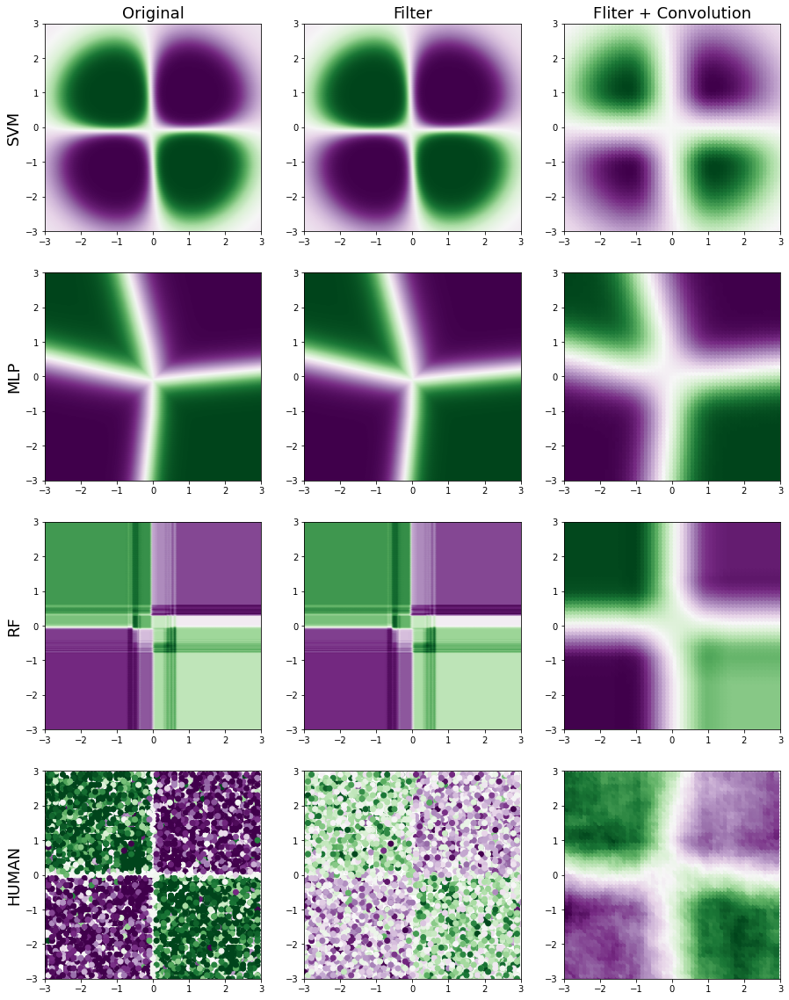

In [34]:
mtypes = ib.mtype[:3] + ['HUMAN']
m = len(mtypes)

fig, axs = plt.subplots(m,3,figsize=(5*3,5*m))

for i, mtype in enumerate(mtypes):
    if i == 3:
        XY = np.column_stack([ib.human[1][:,3], ib.human[1][:,5]]).astype(float)
        X, Y = XY[:,0], XY[:,1]
        mtype_i = ib.human[1][:,0].astype(float)
    else:
        XY = uX
        X, Y = uX0, uX1
        mtype_i = ib.estpst[1][4][i]

    newpst = gaussian_filter(mtype_i, sigma=1)
    temp = np.column_stack([XY, mtype_i]).astype(float)
    xy, newpst2 = ib.smooth_gaussian_distance(temp, radius=1, step=0.1)
    
    axs[i,0].scatter(x=X, y=Y, c=mtype_i, cmap=cmap)
    axs[i,1].scatter(x=X, y=Y, c=newpst,  cmap=cmap)
    axs[i,2].scatter(x=np.array(xy)[:,0], y=np.array(xy)[:,1],c=newpst2,cmap=cmap)

    for j in range(3):
        axs[i,j].set_xlim([-3,3])
        axs[i,j].set_ylim([-3,3])
        if j == 0:
            axs[i,j].set_ylabel(mtype, fontsize=fsize)
        if i == 0:
            axs[i,j].set_title(['Original', 'Filter', 'Fliter + Convolution'][j], fontsize=fsize)


plt.savefig(f'figs/[20210407_gaussian_variance]_filter_convolve_sxor_{str(ib.date.date())}.png', bbox_inches='tight')

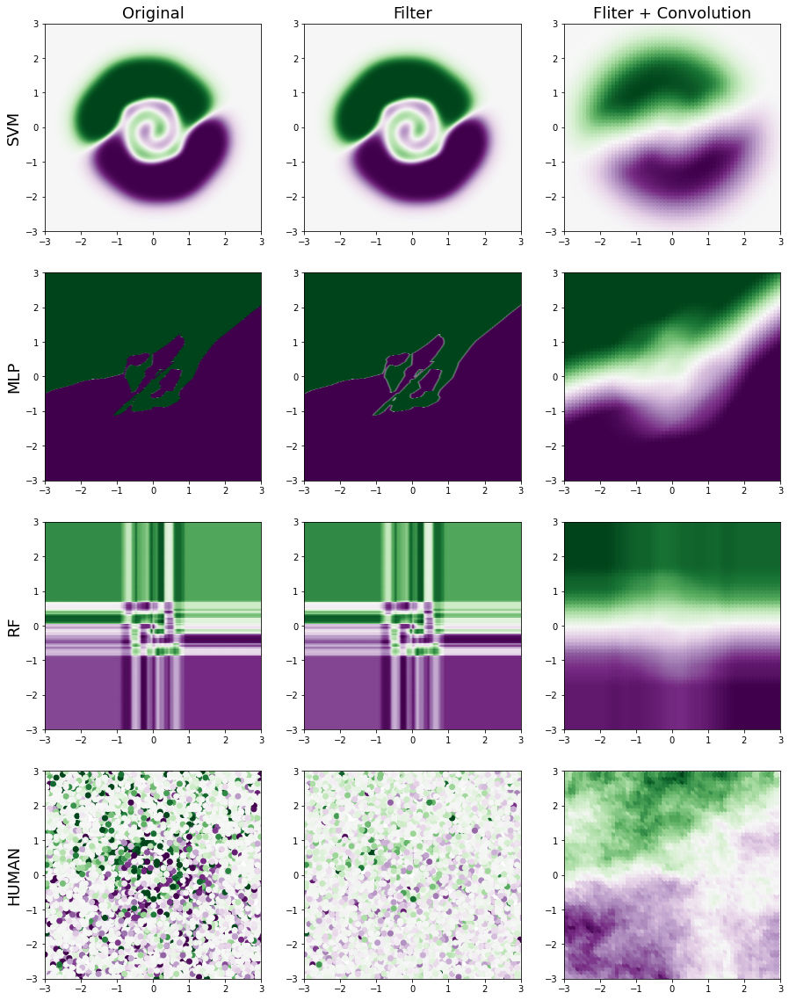

In [35]:
mtypes = ib.mtype[:3] + ['HUMAN']
m = len(mtypes)

fig, axs = plt.subplots(m,3,figsize=(5*3,5*m))

for i, mtype in enumerate(mtypes):
    if i == 3:
        XY = np.column_stack([ib.human[0][:,3], ib.human[0][:,5]]).astype(float)
        X, Y = XY[:,0], XY[:,1]
        mtype_i = ib.human[0][:,0].astype(float)
    else:
        XY = uX
        X, Y = uX0, uX1
        mtype_i = ib.estpst[1][2][i]

    newpst = gaussian_filter(mtype_i, sigma=1)
    temp = np.column_stack([XY, mtype_i]).astype(float)
    xy, newpst2 = ib.smooth_gaussian_distance(temp, radius=1, step=0.1)
    
    axs[i,0].scatter(x=X, y=Y, c=mtype_i, cmap=cmap)
    axs[i,1].scatter(x=X, y=Y, c=newpst,  cmap=cmap)
    axs[i,2].scatter(x=np.array(xy)[:,0], y=np.array(xy)[:,1],c=newpst2,cmap=cmap)

    for j in range(3):
        axs[i,j].set_xlim([-3,3])
        axs[i,j].set_ylim([-3,3])
        if j == 0:
            axs[i,j].set_ylabel(mtype, fontsize=fsize)
        if i == 0:
            axs[i,j].set_title(['Original', 'Filter', 'Fliter + Convolution'][j], fontsize=fsize)


plt.savefig(f'figs/[20210407_gaussian_variance]_filter_convolve_spiral_{str(ib.date.date())}.png', bbox_inches='tight')